In [26]:
# Import packages
import os
os.environ['PROJ_LIB'] = 'Users/kamil/Anaconda3/Lib/site-packages/mpl_toolkits/basemap'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from kneed import KneeLocator

# 1. EDA
---

In [2]:
# load data frame
fw = pd.read_csv("..//Datasets/NEW/FW_with_airports.csv")

In [3]:
fw.head()

,tail_number,date,aircraft,origin_code,origin,destination_code,destination,departure,arrival,duration,...,airport_origin,city_origin,origin_state,country_origin,airport_destination,city_destination,destination_state,country_destination,departure_shift,arrival_shift
0,N100KB,2021-02-20,BE9L,US-0571,Williston Basin International Airport (KXWA),KBIS,Bismarck Muni (KBIS),04:57PM CST,05:44PM CST,46,...,Williston Basin International Airport,Williston,ND,US,Bismarck Municipal Airport,Bismarck,ND,US,day,day
1,N100KB,2021-02-20,BE9L,KBIS,Bismarck Muni (KBIS),US-0571,Williston Basin International Airport (KXWA),01:36PM CST,02:27PM CST,51,...,Bismarck Municipal Airport,Bismarck,ND,US,Williston Basin International Airport,Williston,ND,US,day,day
2,N100KB,2021-02-18,BE9L,KMOT,Minot Intl (KMOT),KBIS,Bismarck Muni (KBIS),08:20AM CST,08:53AM CST,32,...,Minot International Airport,Minot,ND,US,Bismarck Municipal Airport,Bismarck,ND,US,day,day
3,N100KB,2021-02-15,BE9L,US-0571,Williston Basin International Airport (KXWA),KMOT,Minot Intl (KMOT),02:15PM CST,02:49PM CST,33,...,Williston Basin International Airport,Williston,ND,US,Minot International Airport,Minot,ND,US,day,day
4,N100KB,2021-02-15,BE9L,KMOT,Minot Intl (KMOT),US-0571,Williston Basin International Airport (KXWA),08:00AM CST,08:32AM CST,32,...,Minot International Airport,Minot,ND,US,Williston Basin International Airport,Williston,ND,US,day,day


### Questions to the dataset:
1. In what state were performed more fligths?
2. What company operated more in this state? 
3. From what cities this company departured and arrived?
4. What is the possible reasons on this enormous number of flights?

In [68]:
# Top-5 states with the highest number of departure flights 
fw.origin_state.value_counts().head()

TX    1906
KS    1756
SD    1658
AK    1549
CA    1521
Name: origin_state, dtype: int64

In [69]:
# Top-5 states with the highest number of arrival flights
fw.destination_state.value_counts().head()

TX    1911
KS    1755
SD    1635
AK    1546
CA    1525
Name: destination_state, dtype: int64

In [70]:
# Top-5 air medical services with the highest number of flights in Texas state
fw[(fw.origin_state == 'TX') | (fw.destination_state == 'TX')].Owner.value_counts().head()

EAGLEMED LLCWICHITA, KS, US                               728
AIR METHODS CORPGREENWOOD VILLAGE, CO, US(Corporation)    495
DALE AVIATION INCRAPID CITY, SD, US(Corporation)          208
TEXAS CHILDRENS HOSPITALHOUSTON, TX, US(Corporation)      169
CAREFLITEGRAND PRAIRIE, TX, US(Corporation)               153
Name: Owner, dtype: int64

In [71]:
# Top-5 Cities and airports from the 'EAGLEMED LLC' was departing
fw[(fw.Owner == 'EAGLEMED LLCWICHITA, KS, US') & (fw.origin_state == 'TX')]\
      .groupby('city_origin').origin.value_counts().sort_values(ascending=False).head()

city_origin  origin                        
Lubbock      Lubbock Smith Intl (KLBB)         158
Amarillo     Amarillo Intl (KAMA)              115
San Angelo   San Angelo Rgnl (KSJT)             38
Dallas       Dallas Love Fld (KDAL)             35
Fort Worth   Fort Worth Meacham Intl (KFTW)     20
Name: origin, dtype: int64

In [72]:
# Top-5 Cities and airports from the 'EAGLEMED LLC' was arriving
fw[(fw.Owner == 'EAGLEMED LLCWICHITA, KS, US') & (fw.destination_state == 'TX')]\
      .groupby('city_destination').destination.value_counts().sort_values(ascending=False).head()

city_destination  destination                   
Lubbock           Lubbock Smith Intl (KLBB)         156
Amarillo          Amarillo Intl (KAMA)              113
San Angelo        San Angelo Rgnl (KSJT)             41
Dallas            Dallas Love Fld (KDAL)             34
Fort Worth        Fort Worth Meacham Intl (KFTW)     20
Name: destination, dtype: int64

## Outcomes:
1. The most number of departure and arrival flights were performed in Texas state from 29 Nov.2020 to 10 Mar.2021. There are 1906 and 1911 flights in origin and destination location respectively. 
2. The air medical company that made the most quantity of flights in Texas is "EAGLEMED LLC", which the head office is located in WICHITA, KS. It performed 728 flights during the period. 
3. The most used airport in Texas by "EAGLEMED LLC" is Lubbock Smith International airport in Lubbock city. There are 158 and 156 flights for origin and destination location respectively. 
4. To answer this question, we have to perform some deeper analysis rather than EDA. For the initial stage of the analysis, let's take just one state and analyze the number of flights, the unique air medical services, and all locations where were performed that flights. So, I chose the state which has the most number of flights during the period (29Nov.2020- 10Mar.2021). In this case, it is Texas. The further step would be a cluster analysis based on the number of flights, services, and location. Then we'll compare cluster segmentation with population and COVID19 cases of each city. 

# 2. Comparing number of flights in Texas with the population
---

In [28]:
# calculate number of flight in TX for origin and destination locations
tx_origin = fw[(fw.origin_state == 'TX')].origin.value_counts().reset_index()
tx_destination = fw[(fw.destination_state == 'TX')].destination.value_counts().reset_index()

# merge origin and destination
tx_flights = tx_origin.merge(tx_destination, how='inner').rename({'index':'location'}, axis=1)

# add total flights
tx_flights['total_flights'] = tx_flights.origin + tx_flights.destination

# Merge coordinates
tx_flights = tx_flights.merge(fw[['origin', 'origin_Latitude', 'origin_Longitude']]\
                       .drop_duplicates(subset='origin').rename({'origin':'location'}, axis=1))

# Merge number of unique services 
tx_flights = tx_flights.merge(fw.groupby('origin').Owner.nunique().reset_index().rename({'origin':'location'}, axis=1))

tx_flights

,location,origin,destination,total_flights,origin_Latitude,origin_Longitude,Owner
0,Lubbock Smith Intl (KLBB),252,249,501,33.663601,-101.822998,12
1,William P Hobby (KHOU),197,199,396,29.645399,-95.278900,24
2,El Paso Intl (KELP),195,196,391,31.807199,-106.377998,11
3,Amarillo Intl (KAMA),154,149,303,35.219398,-101.706001,12
4,Dallas Love Fld (KDAL),131,132,263,32.847099,-96.851799,15
...,...,...,...,...,...,...,...
119,Kleberg County (KIKG),1,1,2,27.550900,-98.030899,1
120,Wilbarger County (F05),1,1,2,34.225700,-99.283798,1
121,Cherokee County (KJSO),1,1,2,31.869301,-95.217400,1
122,Stanton Muni (63F),1,1,2,32.173599,-101.821999,1


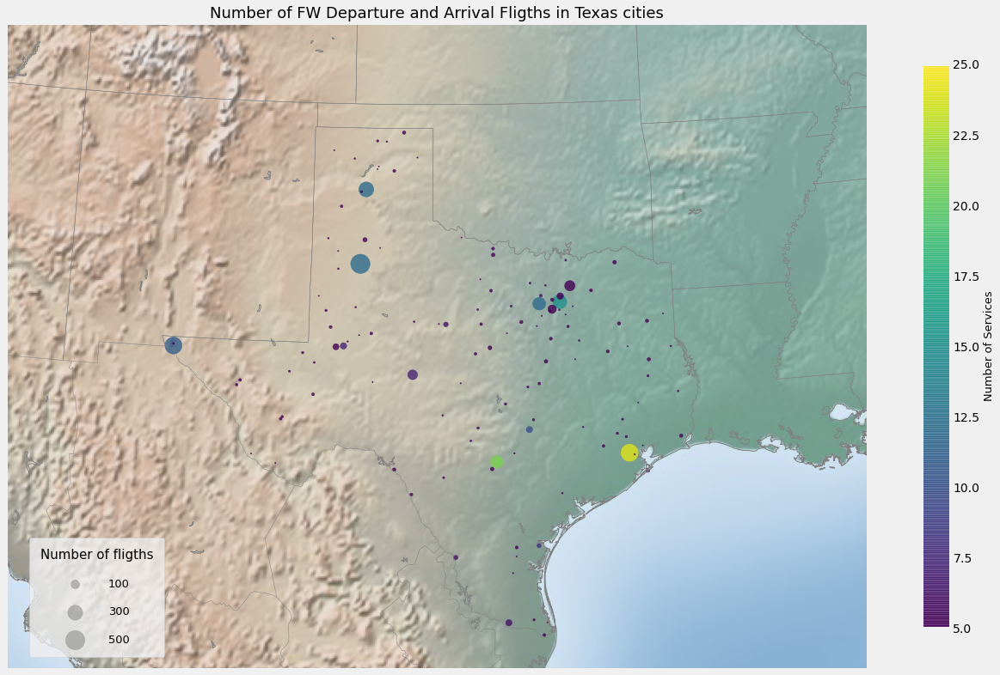

In [431]:
# Extract the data we're interested in
lat = tx_flights['origin_Latitude'].values
lon = tx_flights['origin_Longitude'].values
count = tx_flights['total_flights'].values
service = tx_flights['Owner'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting number of the unique services
# and size reflecting number of fligths 
m.scatter(lon, lat, latlon=True, c=service,
          s=count, alpha=0.8,  cmap='viridis')

# 3. create colorbar and legend
plt.colorbar(shrink=0.75).set_label(label=r'Number of Services', size=13)
plt.clim(5, 25)

# 4. make legend with dummy points
for count in [100, 300, 500]:
    plt.scatter([], [], s=count, alpha=0.5,
                label=str(count), color='grey')

plt.legend(scatterpoints=1, frameon=True, labelspacing=1.5, title='Number of fligths', title_fontsize=15, 
           loc='lower left', bbox_to_anchor=(0.02, 0.01, 0.5, 0.5), fontsize=13, borderpad=1, handletextpad=2)

plt.title('Number of FW Departure and Arrival Flights in Texas cities', fontsize=18)
#plt.savefig('..//images/Cluster Analysis/Number of FW Departure and Arrival Fligths in Texas cities.jpeg', bbox_inches='tight')
plt.show()

The above graph represents the number of flights and unique services for each city that used a particular location as origin and destination. The size of the dot represents the number of flights and the color shows the number of the unique services. The same and more detailed information you can find in our [Tableau dashboard](https://public.tableau.com/views/FWFlightsAnalysis/FWPathAnalysis?:language=en&:display_count=y&:origin=viz_share_link). 

###  Questions to the plot:
1. Why there are a few flights in the central area in Texas?
2. Why there are almost no flights in the south part of Texas?

To answer the questions in this uncertain situation the unsupervised learning might come to help. The simplest and powerful technique in this case is K-means cluster analysis.  

## K-Means Cluster Analysis
The very important step before apply K-Means cluster analysis is data preparation and feature variable selection. In this stage, we'll take all variables except "location" and scale them.

In [29]:
# Rescale feature variables
features = tx_flights[['origin', 'destination', 'total_flights', 
                       'Owner', 'origin_Latitude', 'origin_Longitude']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_features[:5]

array([[ 5.99244436,  5.92748028,  5.96039204,  2.47542793,  0.85301955,
        -0.97324346],
       [ 4.59994476,  4.65913247,  4.62981964,  5.79683168, -0.96519759,
         1.27537553],
       [ 4.54930842,  4.58303161,  4.56645905,  2.19864428,  0.01300674,
        -2.53838821],
       [ 3.51126327,  3.39078467,  3.45131266,  2.47542793,  1.55701025,
        -0.93304209],
       [ 2.92894525,  2.95954641,  2.94442794,  3.30577887,  0.4835563 ,
         0.73491139]])

In [81]:
# Instantiate parameters
kmeans_kwargs = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42,}

In [82]:
# Apply elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

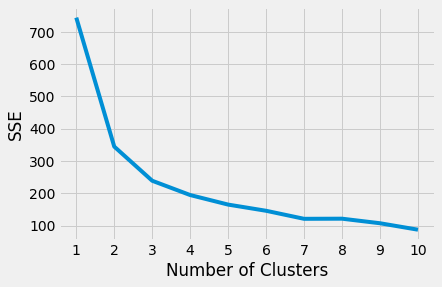

In [83]:
# Plot SSE results for each n_cluster
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [84]:
# Use KneeLocator to confirn the best number of clusters
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

3

The elbow method and a KneeLocator tachnique identif that the best number of cluster is __3__. Apply these parameters to the model:

In [30]:
# Instantiate the KMeans class
kmeans = KMeans(
    init="random",
    n_clusters=3,
    n_init=10,
    max_iter=300,
    random_state=42
)

In [31]:
# Fit model
kmeans.fit(scaled_features)

KMeans(init='random', n_clusters=3, random_state=42)

In [32]:
# Assign cluster for each row
tx_flights['cluster'] = kmeans.labels_

In [33]:
# observe the results
tx_flights

,location,origin,destination,total_flights,origin_Latitude,origin_Longitude,Owner,cluster
0,Lubbock Smith Intl (KLBB),252,249,501,33.663601,-101.822998,12,0
1,William P Hobby (KHOU),197,199,396,29.645399,-95.278900,24,0
2,El Paso Intl (KELP),195,196,391,31.807199,-106.377998,11,0
3,Amarillo Intl (KAMA),154,149,303,35.219398,-101.706001,12,0
4,Dallas Love Fld (KDAL),131,132,263,32.847099,-96.851799,15,0
...,...,...,...,...,...,...,...,...
119,Kleberg County (KIKG),1,1,2,27.550900,-98.030899,1,1
120,Wilbarger County (F05),1,1,2,34.225700,-99.283798,1,2
121,Cherokee County (KJSO),1,1,2,31.869301,-95.217400,1,1
122,Stanton Muni (63F),1,1,2,32.173599,-101.821999,1,2


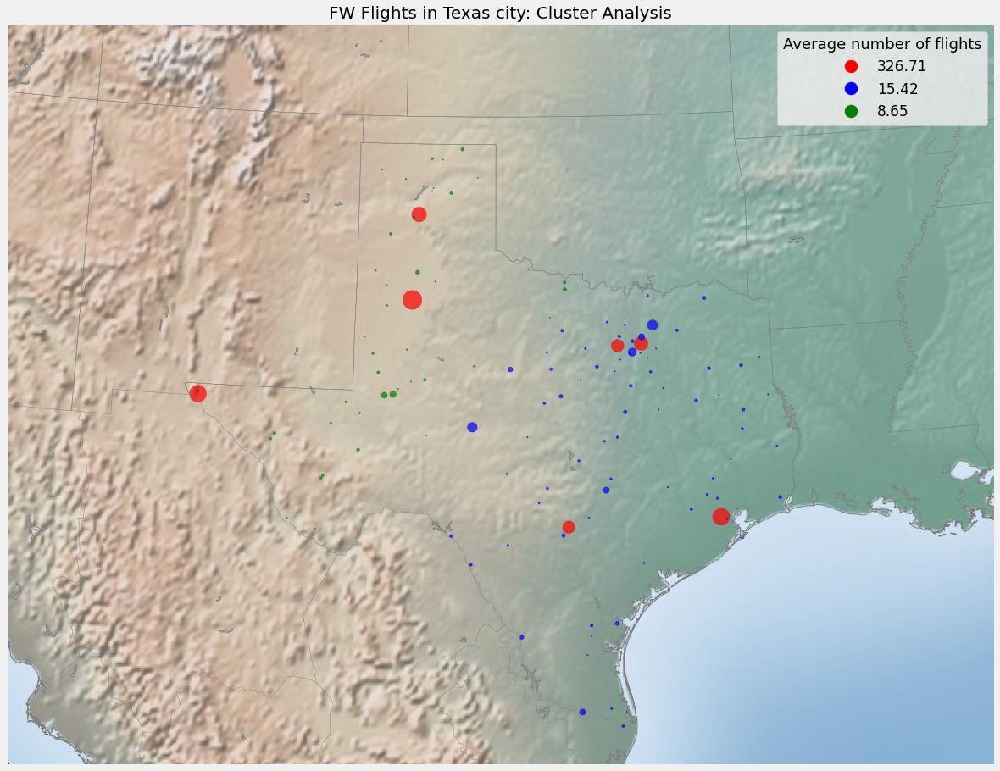

In [468]:
# Extract the data we're interested in
lat = tx_flights['origin_Latitude'].values
lon = tx_flights['origin_Longitude'].values
cluster = tx_flights['cluster'].values
count = tx_flights['total_flights'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting number of cluster 
# and size reflecting number of fligths
colours = ListedColormap(['r','b','g'])
m.scatter(lon, lat, latlon=True, c=cluster, s=count, alpha=0.7, cmap=colours)

# 3. Create legend with cluster labels 
scatter = plt.scatter(lon, lat, c=cluster, cmap=colours)
labels = list(round(tx_flights.groupby('cluster').total_flights.mean(),2))

legend = plt.legend(handles=scatter.legend_elements()[0], labels=labels, 
                    title='Average number of flights', fontsize=17, title_fontsize=18)
for legend_handle in legend.legendHandles:
    legend_handle._legmarker.set_markersize(15)
    
plt.title('FW Flights in Texas city: Cluster Analysis', fontsize=20)
# plt.savefig('..//images/Cluster Analysis/FW Flights in Texas city. Cluster Analysis.jpeg', bbox_inches='tight')
plt.show()

According to the graph above, the red cluster was assigned the flights with the higher number of flights and services. Basically, they might be centroids for each region and part of the state. The green and blue clusters were assigned flights with a medium and small number of flights and services respectively. But unfortunately, flights cluster analysis doesn't answer to our question. Let's identify the cities of red cluster:

In [34]:
# merge city name
tx_flights = fw[['origin', 'city_origin']].rename({'origin':'location'}, axis=1).drop_duplicates()\
                                          .merge(tx_flights, how='right')

# extract cities with the largest number of fligths and services
tx_flights[tx_flights.cluster == 0].sort_values(by='total_flights', ascending=False)

,location,city_origin,origin,destination,total_flights,origin_Latitude,origin_Longitude,Owner,cluster
0,Lubbock Smith Intl (KLBB),Lubbock,252,249,501,33.663601,-101.822998,12,0
1,William P Hobby (KHOU),Houston,197,199,396,29.645399,-95.278900,24,0
2,El Paso Intl (KELP),El Paso,195,196,391,31.807199,-106.377998,11,0
3,Amarillo Intl (KAMA),Amarillo,154,149,303,35.219398,-101.706001,12,0
4,Dallas Love Fld (KDAL),Dallas,131,132,263,32.847099,-96.851799,15,0
5,Fort Worth Meacham Intl (KFTW),Fort Worth,109,112,221,32.819801,-97.362396,12,0
6,San Antonio Intl (KSAT),San Antonio,106,106,212,29.533701,-98.469803,21,0


In [474]:
tx_flights[tx_flights.cluster == 0].city_origin.values

array(['Lubbock', 'Houston', 'El Paso', 'Amarillo', 'Dallas',
       'Fort Worth', 'San Antonio'], dtype=object)

The obvious reason for this big amount of flights in these cities might be related to their population and population density. Also, the question is how each of them is correlated with the number of flights: positively or negatively. For now, we'll call these urban cities __metropolis__, the rest cities will assign to the rural areas. Next, compare the population and number of flights to those cities in Texas. 

In [286]:
# load population dataset from source: https://simplemaps.com/data/us-cities
pop = pd.read_csv("../Datasets/uscities.csv")
pop.head()

,city,city_ascii,state_id,state_name,county_fips,county_name,lat,lng,population,density,source,military,incorporated,timezone,ranking,zips,id
0,New York,New York,NY,New York,36061,New York,40.6943,-73.9249,18713220,10715,polygon,False,True,America/New_York,1,11229 11226 11225 11224 11222 11221 11220 1138...,1840034016
1,Los Angeles,Los Angeles,CA,California,6037,Los Angeles,34.1139,-118.4068,12750807,3276,polygon,False,True,America/Los_Angeles,1,90291 90293 90292 91316 91311 90037 90031 9000...,1840020491
2,Chicago,Chicago,IL,Illinois,17031,Cook,41.8373,-87.6862,8604203,4574,polygon,False,True,America/Chicago,1,60018 60649 60641 60640 60643 60642 60645 6064...,1840000494
3,Miami,Miami,FL,Florida,12086,Miami-Dade,25.7839,-80.2102,6445545,5019,polygon,False,True,America/New_York,1,33129 33125 33126 33127 33128 33149 33144 3314...,1840015149
4,Dallas,Dallas,TX,Texas,48113,Dallas,32.7936,-96.7662,5743938,1526,polygon,False,True,America/Chicago,1,75287 75098 75233 75254 75251 75252 75253 7503...,1840019440


In [440]:
# filter and take only Texas state
tx = pop[pop.state_id == 'TX'].reset_index(drop=True)
tx.sort_values(by='population', ascending=False)[['city', 'state_id', 'population']].head(15)

,city,state_id,population
0,Dallas,TX,5743938
1,Houston,TX,5464251
2,San Antonio,TX,2049293
3,Austin,TX,1687311
4,Fort Worth,TX,909585
5,El Paso,TX,843386
6,McAllen,TX,804114
7,Denton,TX,457177
8,Arlington,TX,398854
9,Corpus Christi,TX,342464


According to the table above, which represents the cities with the TOP-15 cities with highest population in Texas, all cities of the red cluster presented in this table. So, It implies that the number of flights correlated with population. But the main reason is in infrastructure. The cities with high population have a plenty variety of medical services. And people have to fly to these megapolises for better medical service quality, or they probably don't have a choice in their rural areas. That is why those cities have an enormous number of departure and arrival flights comparing with other cities in Texas.

The question is to which metropolis to fly is closer for each rural city? The __KNN__ algorithms might answer this question.

In [434]:
# split to train and test set 
X = tx_flights[tx_flights.cluster == 0][['origin_Latitude', 'origin_Longitude']]
y = [i for i in range(len(tx_flights[tx_flights.cluster == 0]['cluster']))]
X_test = tx_flights[tx_flights.cluster != 0][['origin_Latitude', 'origin_Longitude']]

In [435]:
# instantiate KNN algorithms
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X,y)
y_test = knn.predict(X_test)

In [436]:
# concat test and train sets 
test = pd.concat([X_test.reset_index(drop=True), pd.Series(y_test)], axis=1)
train = pd.concat([X.reset_index(drop=True), pd.Series(y)], axis=1)
knn_res = pd.concat([test,train])

# merge knn labels
tx_flights = tx_flights.merge(knn_res).rename({0:'knn_label'}, axis=1)

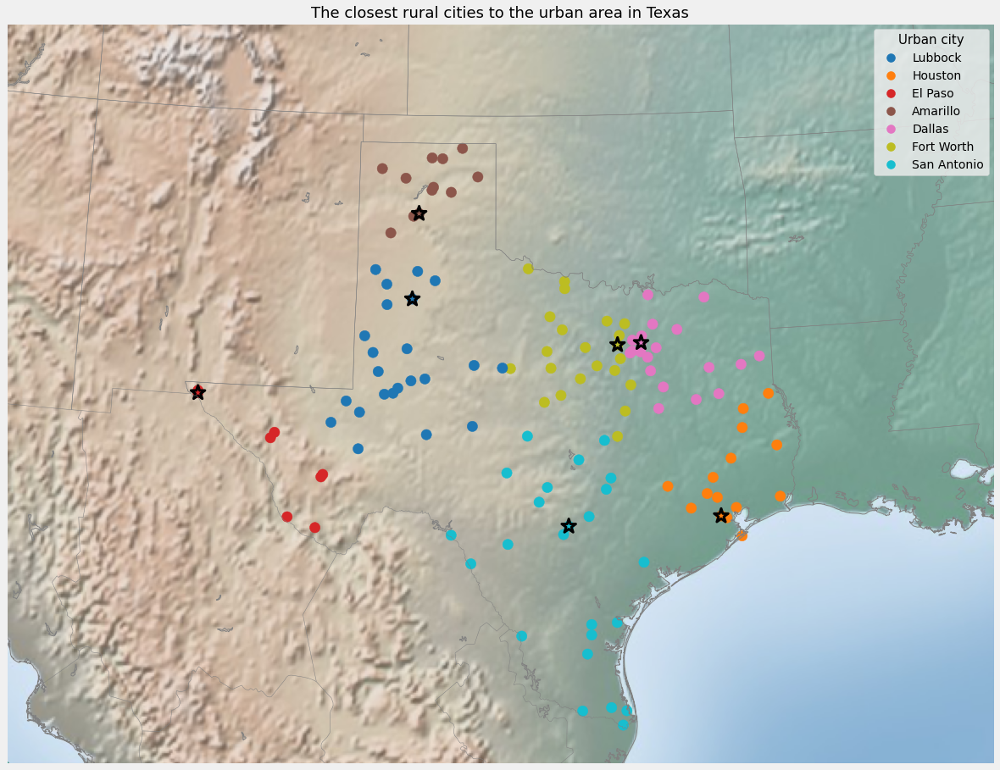

In [438]:
# Extract the data we're interested in
lat = knn_res['origin_Latitude'].values
lon = knn_res['origin_Longitude'].values
city = knn_res[0].values

x =  train['origin_Longitude'].values
y = train['origin_Latitude'].values
megalopolis = train[0].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = fig.add_subplot()
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
m.scatter(lon, lat, latlon=True, c=city, cmap='tab10', s=150)
m.scatter(x,y, latlon=True, marker='*', s=300, c=megalopolis, cmap='tab10', linewidth=3, edgecolor='black')

# 3. Create legend with Megalosis labels 
scatter = plt.scatter(lon, lat, c=city, cmap='tab10')
labels = list(tx_flights[tx_flights.cluster == 0].city_origin)
legend = plt.legend(handles=scatter.legend_elements()[0], labels=labels, title='Urban city', title_fontsize=15)
for legend_handle in legend.legendHandles:
    legend_handle._legmarker.set_markersize(10)
    
plt.title('The closest rural cities to the urban area in Texas', fontsize=18)
# plt.savefig('..//images/Cluster Analysis/The closest rural cities to the urban area in Texas.jpeg', bbox_inches='tight')
plt.show()

The plot above represents the rural area by color. The star sign represents the location of each metropolis. For instance, the red dots represent rural cities that are closer to El Paso city and the star sign under the red dot is the exact location of El Paso. The complete list of rural cities that closer to El Paso, you can observe in the table below:  

In [97]:
tx_flights[tx_flights.knn_label == 2]

,location,city_origin,origin,destination,total_flights,origin_Latitude,origin_Longitude,Owner,cluster,knn_label
3,El Paso Intl (KELP),El Paso,195,196,391,31.807199,-106.377998,11,0,2
42,"Van Horn, TX",Van Horn,5,5,10,31.161030,-104.703910,2,1,2
63,Culberson County (KVHN),Van Horn,4,5,9,31.057800,-104.783997,2,1,2
95,Alpine-Casparis Muni (E38),Alpine,6,4,10,30.384199,-103.683998,2,1,2
106,Biggs Aaf (Fort Bliss) (KBIF),Fort Bliss/El Paso/,3,2,5,31.849501,-106.379997,2,1,2
108,"Marfa, TX",Marfa,3,5,8,30.429290,-103.647930,1,1,2
109,"Presidio, TX",Presidio,1,1,2,29.457790,-103.772440,1,1,2
110,Presidio Lely Intl (KPRS),Presidio,1,1,2,29.634212,-104.361493,1,1,2


The next step is vizualize the population and density population:

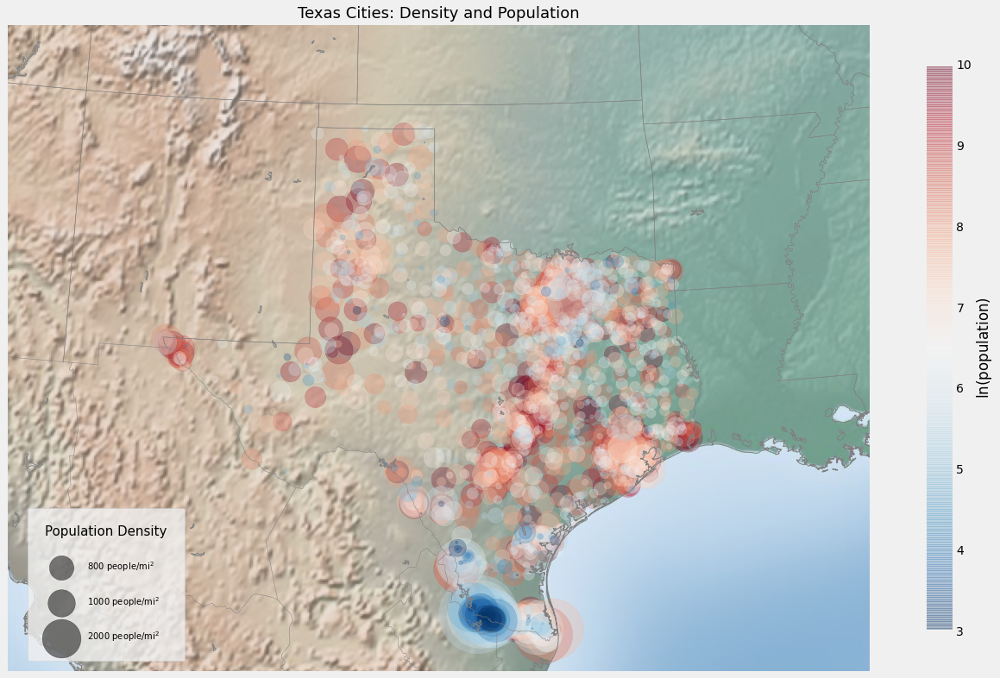

In [441]:
# Extract the data we're interested in
lat = tx['lat'].values
lon = tx['lng'].values
population = tx['population'].values
density = tx['density'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
m.scatter(lon, lat, latlon=True,
          c=np.log(population), s=density,
          cmap='RdBu_r', alpha=0.3)

# 3. create colorbar and legend
plt.colorbar(label=r'$\ln({\rm population})$', shrink=0.75)
plt.clim(3, 10)

# 4. make legend with dummy points
for density in [800, 1000, 2000]:
    plt.scatter([], [], c='k', alpha=0.5, s=density,
                label=str(density) +' people/mi$^2$')
plt.legend(scatterpoints=1, frameon=True, labelspacing=2.5, title='Population Density', title_fontsize=15,
           loc='lower left', bbox_to_anchor=(0.02, 0.01, 0.5, 0.5), fontsize=10, borderpad=2, handletextpad=2)
plt.title('Texas Cities: Density and Population', fontsize=18)
# plt.savefig('..//images/Cluster Analysis/Texas Cities: Density and Population.jpeg', bbox_inches='tight')
plt.show()

Now, the graph below might answer our question why there are a few flights in the central area in Texas. It is just because not a lot of people live here. The population is small and not covered some areas in the middle of Texas.

The answer to the second question might hide in the density population. The population is relatively smaller in the south area, but the density population is abnormally high. Thus, it implies that air medical services don't use aircraft with fixed wings in areas with a small population and a high-density population. It totally makes sense, because there is a possibility of only short-term flights in these conditions. Helicopters are completely suitable for these purposes. 

In [446]:
# Rescale feature variables
features = tx[['density', 'population']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

In [32]:
# Instantiate parameters
kmeans_kwargs = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42,}

In [33]:
# Apply elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

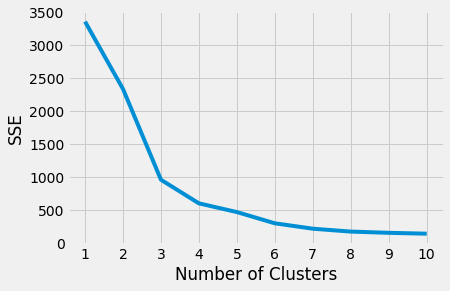

In [34]:
# Plot SSE results for each n_cluster
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [35]:
# Use KneeLocator to confirn the best number of clusters
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

In [447]:
# Instantiate the KMeans class
kmeans = KMeans(
    init="random",
    n_clusters=4,
    n_init=10,
    max_iter=300,
    random_state=42
)

In [448]:
# Fit model
kmeans.fit(scaled_features)

KMeans(init='random', n_clusters=4, random_state=42)

In [449]:
# Assign cluster for each row
tx['cluster'] = kmeans.labels_

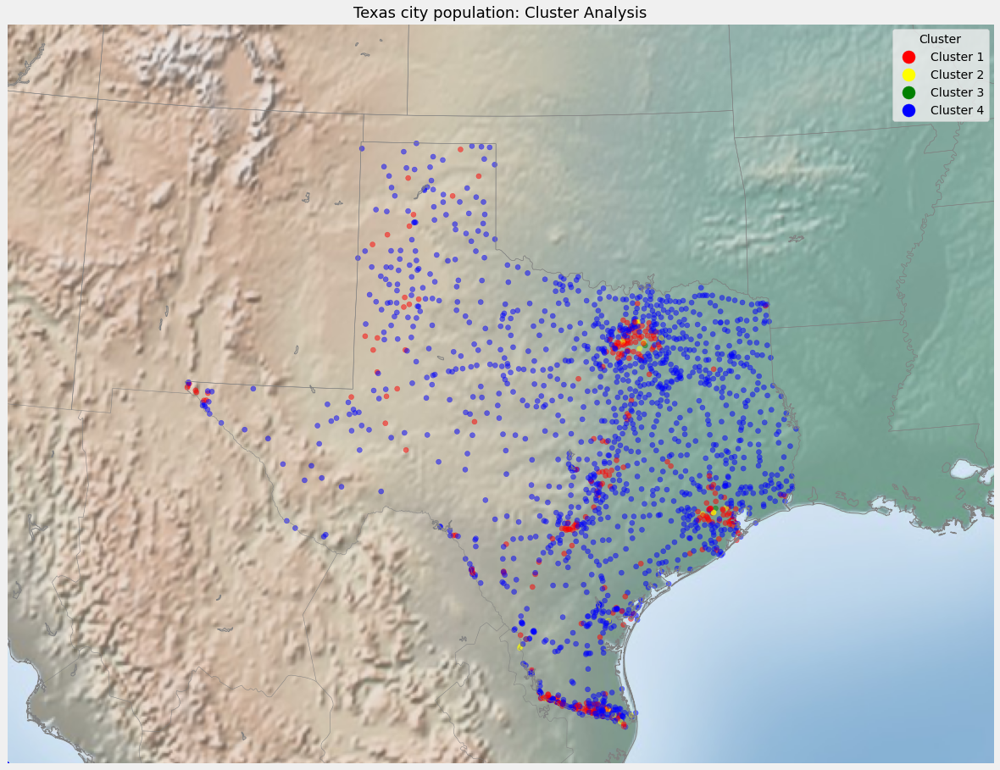

In [450]:
# Extract the data we're interested in
lat = tx['lat'].values
lon = tx['lng'].values
cluster = tx['cluster'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
colours = ListedColormap(['r','yellow','g','b'])
m.scatter(lon, lat, latlon=True,
          c=cluster,
          cmap=colours, alpha=0.5)

# 3. Create legend with cluster labels 
scatter = plt.scatter(lon, lat, c=cluster, cmap=colours)
labels = ['Cluster 1','Cluster 2','Cluster 3','Cluster 4']

legend = plt.legend(handles=scatter.legend_elements()[0], labels=labels, title='Cluster')
for legend_handle in legend.legendHandles:
    legend_handle._legmarker.set_markersize(15)
    
plt.title('Texas city population: Cluster Analysis', fontsize=18)
plt.savefig('..//images/Cluster Analysis/Texas city population. Cluster Analysis.jpeg', bbox_inches='tight')
plt.show()

There is an interesting observation of the cluster analysis outcomes of the population and population density. The accumulation of red dots is corresponding to the location of the urban areas. It also proves the relationship between a number of flights and population.

## Outcomes:
1. According to the analysis, the reason for a few amount of FW aircraft flights in Texas might be either a low population of the area or a high population density. 
2. The cities with the highest number of flights tend to be metropolises with high population and might be a center of the services of closest rural areas. The closest rural cities to the metropolis were identified via KNN algorithms. 
3. The cluster analysis of the population and density population showed the relationship with the location of the urban areas. 

# 3. Comparing number of flights in Texas with the COVID19 cases
---

In [412]:
covid = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv', parse_dates=['date'], index_col='date')

In [413]:
covid.head()

,county,state,fips,cases,deaths
date,,,,,
2020-01-21,Snohomish,Washington,53061.0,1,0.0
2020-01-22,Snohomish,Washington,53061.0,1,0.0
2020-01-23,Snohomish,Washington,53061.0,1,0.0
2020-01-24,Cook,Illinois,17031.0,1,0.0
2020-01-24,Snohomish,Washington,53061.0,1,0.0


In [414]:
# take date range between 2020-10-29 and 2021-03-10
covid = covid.loc['2020-10-29':'2021-03-10']

# merge coordinates
covid = covid.merge(pop[['city', 'state_name', 'lat', 'lng']].drop_duplicates(subset=['city', 'state_name']), 
            how='left', left_on=['county','state'], right_on=['city','state_name']).dropna().drop(['city', 'state_name'], axis=1)

In [416]:
tx_covid = covid[covid.state == 'Texas']
tx_covid.head()

,county,state,fips,cases,deaths,lat,lng
2619,Anderson,Texas,48001.0,2970,39.0,30.4871,-95.9899
2620,Andrews,Texas,48003.0,655,10.0,32.3208,-102.5520
2626,Austin,Texas,48015.0,514,10.0,30.3004,-97.7522
2627,Bailey,Texas,48017.0,296,5.0,33.4335,-96.1649
2628,Bandera,Texas,48019.0,185,8.0,29.7253,-99.0740


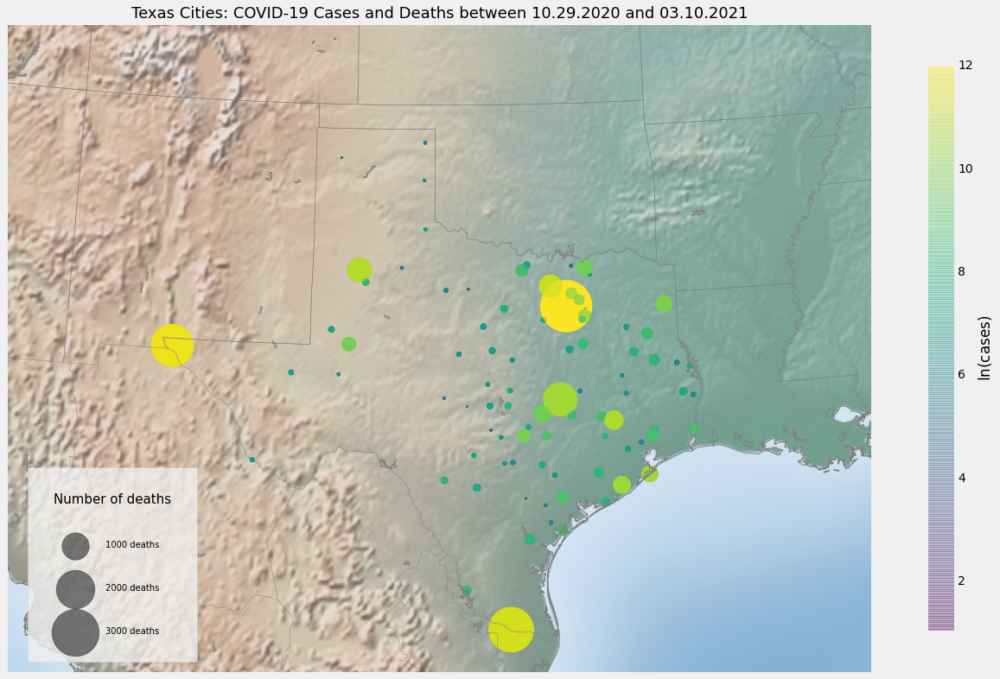

In [471]:
# Extract the data we're interested in
lat = tx_covid['lat'].values
lon = tx_covid['lng'].values
cases = tx_covid['cases'].values
deaths = tx_covid['deaths'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=31.96, lon_0=-99.9,
            width=2E6, height=1.5E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting cases
# and size reflecting deaths
m.scatter(lon, lat, latlon=True, c=np.log(cases), 
          s=deaths, cmap='viridis', alpha=0.3)

# 3. create colorbar and legend
plt.colorbar(label=r'$\ln({\rm cases})$', shrink=0.75)
plt.clim(1, 12)

# 4. make legend with dummy points
for deaths in [1000, 2000, 3000]:
    plt.scatter([], [], c='k', alpha=0.5, s=deaths,
                label=str(deaths) +' deaths')
plt.legend(scatterpoints=1, frameon=True, labelspacing=4, title='Number of deaths', title_fontsize=15,
           loc='lower left', bbox_to_anchor=(0.02, 0.01, 0.5, 0.5), fontsize=10, borderpad=3, handletextpad=2.5)
plt.title('Texas Cities: COVID-19 Cases and Deaths between 10.29.2020 and 03.10.2021', fontsize=18)
plt.savefig('..//images/Cluster Analysis/Texas Cities. COVID-19 Cases and Deaths between 10.29.2020 and 03.10.2021.jpeg', bbox_inches='tight')
plt.show()

The majority of cities with the highest number of COVID-19 cases and deaths coincides with the urban areas of our map. Again, it depends on the population of the area. To assume about does the number of flights increased during the pandemic, we need to have flight history data before lockdown. Otherwise, it's difficult to find any correlation because the maps are almost similar. 

# Summary
---
The most number of departure and arrival flights were performed in Texas state from 29 Nov.2020 to 10 Mar.2021. Thus, this state was chosen to the initial analysis. The air medical company that made the most quantity of flights is "EAGLEMED LLC", which the head office is located in WICHITA, KS. The most used airport in Texas by "EAGLEMED LLC" is Lubbock Smith International airport in Lubbock city. It is also the most used location for FW flights in Texas.  The reason might that this city is located in an area with a small number of settlements.  

K-Means cluster analysis identified the cities with urban types and potential centers of the medical services. Based on these cities was performed KNN classification of rural cities located closer to one of the metropolises. Visualization of population gave a potential reason for a few amount of FW aircraft flights in Texas. It might be either a low number of settlements in the area or a high population density with a low population. There is a possibility of only short-term flights in the second condition. Helicopters are completely suitable for these purposes.The cluster analysis of the population and density population showed the relationship with the location of the urban areas.  

# FW Cluster Analysis in the US
---

In [41]:
# calculate number of flight for origin and destination locations only in the US
origin = fw.loc[(fw.country_origin == 'US') & (fw.country_destination == 'US')].origin.value_counts().reset_index()
destination = fw.loc[(fw.country_origin == 'US') & (fw.country_destination == 'US')].destination.value_counts().reset_index()

# merge origin and destination
flights = origin.merge(destination, how='inner').rename({'index':'location'}, axis=1)

# add total flights
flights['total_flights'] = flights.origin + flights.destination

# Merge coordinates
flights = flights.merge(fw[['origin', 'origin_Latitude', 'origin_Longitude']]\
                       .drop_duplicates(subset='origin').rename({'origin':'location', 
                                                                 'origin_Latitude':'Latitude', 'origin_Longitude':'Longitude'}, axis=1))

# Merge number of unique services 
flights = flights.merge(fw.groupby('origin').Owner.nunique().reset_index().rename({'origin':'location'}, axis=1))

# merge city name
flights = fw[['origin', 'city_origin', 'origin_state']].rename({'origin':'location', 'city_origin': 'city', 'origin_state': 'state'}, 
                                                               axis=1).drop_duplicates().merge(flights, how='right')

flights.head()

,location,city,state,origin,destination,total_flights,Latitude,Longitude,Owner
0,Centennial (KAPA),Denver,CO,603,606,1209,39.570099,-104.848999,26
1,Joe Foss Fld (KFSD),Sioux Falls,SD,521,521,1042,43.582001,-96.741898,11
2,Billings Logan Intl (KBIL),Billings,MT,512,511,1023,45.807701,-108.542999,16
3,Salt Lake City Intl (KSLC),Salt Lake City,UT,490,492,982,40.788399,-111.977997,18
4,Anchorage Intl (PANC),Anchorage,AK,424,425,849,61.174400,-149.996002,10


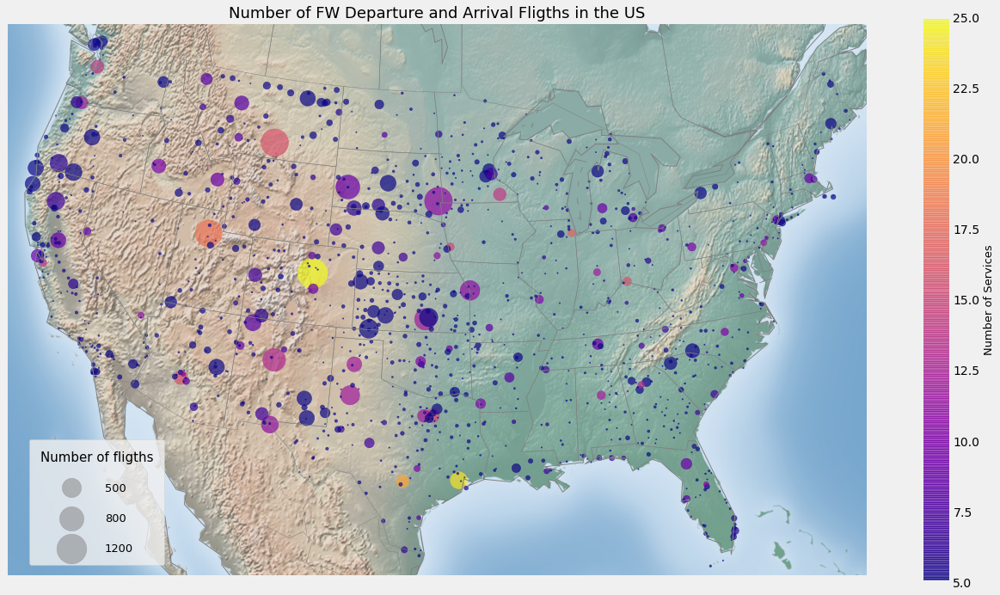

In [219]:
# Extract the data we're interested in
lat = flights['Latitude'].values
lon = flights['Longitude'].values
count = flights['total_flights'].values
service = flights['Owner'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting number of the unique services
# and size reflecting number of fligths 
m.scatter(lon, lat, latlon=True, alpha=0.7, c=service, s=count,  cmap='plasma')

# 3. create colorbar and legend
plt.colorbar(shrink=0.75).set_label(label=r'Number of Services', size=13)
plt.clim(5, 25)

# 4. make legend with dummy points
for count in [500, 800, 1200]:
    plt.scatter([], [], s=count, alpha=0.5,
                label=str(count), color='grey')

plt.legend(scatterpoints=1, frameon=True, labelspacing=1.7, title='Number of fligths', title_fontsize=15, 
           loc='lower left', bbox_to_anchor=(0.02, 0.01, 0.5, 0.5), fontsize=13, borderpad=1, handletextpad=2)

plt.title('Number of FW Departure and Arrival Fligths in the US', fontsize=18)
plt.show()

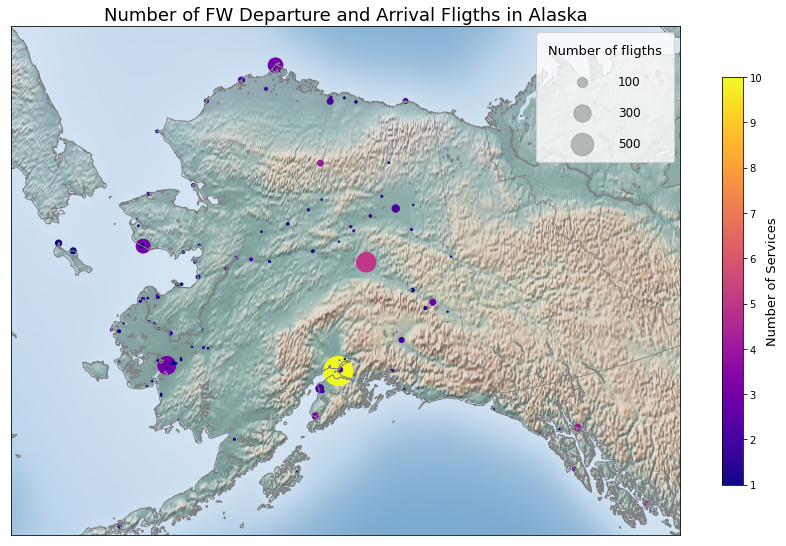

In [148]:
# Extract the data we're interested in
lat = flights['Latitude'].values
lon = flights['Longitude'].values
count = flights['total_flights'].values
service = flights['Owner'].values

# 1. Draw the map background
fig = plt.figure(figsize=(15, 10))
m = Basemap(projection='lcc', resolution='h', 
            lat_0=64.2, lon_0=-149.49,
            width=2.5E6, height=1.9E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting number of the unique services
# and size reflecting number of fligths 
m.scatter(lon, lat, latlon=True, c=service, s=count, cmap='plasma')

# 3. create colorbar and legend
plt.colorbar(shrink=0.75).set_label(label=r'Number of Services', size=13)
plt.clim(1, 10)

# 4. make legend with dummy points
for count in [100, 300, 500]:
    plt.scatter([], [], s=count, alpha=0.5,
                label=str(count), color='grey')

plt.legend(scatterpoints=1, frameon=True, labelspacing=1.5, title='Number of fligths', title_fontsize=13, 
           loc='upper right', fontsize=12, borderpad=1, handletextpad=2)

plt.title('Number of FW Departure and Arrival Fligths in Alaska', fontsize=18)
plt.show()

## K-Means Cluster Analysis
---
The K-means clustering will be performed for Alaska separately because its locations are significantly affected clustering. 

In [200]:
# Rescale feature variables
features = flights[flights.state != 'AK'][['origin', 'destination', 'total_flights', 
                       'Owner', 'Latitude', 'Longitude']]

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_features[:5]

array([[12.47079946, 12.53396536, 12.5090561 ,  8.61506031,  0.282356  ,
        -0.55201042],
       [10.72592442, 10.72547957, 10.7314256 ,  3.07427326,  1.0356657 ,
         0.049711  ],
       [10.53441374, 10.51271653, 10.52918021,  4.92120227,  1.45358263,
        -0.82618475],
       [10.06627653, 10.10846677, 10.09275595,  5.65997388,  0.51111461,
        -1.0811355 ],
       [ 7.76814842,  7.95956012,  7.86805669,  2.33550165,  1.12265873,
        -0.41900546]])

In [201]:
# Instantiate parameters
kmeans_kwargs = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42,}

In [202]:
# Apply elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

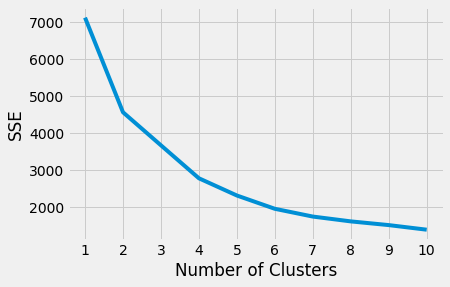

In [203]:
# Plot SSE results for each n_cluster
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [204]:
# Use KneeLocator to confirn the best number of clusters
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

In [273]:
# Instantiate the KMeans class
kmeans = KMeans(
    init="random",
    n_clusters=4,
    n_init=10,
    max_iter=300,
    random_state=42
)

In [274]:
# Fit model
kmeans.fit(scaled_features)

KMeans(init='random', n_clusters=4, random_state=42)

In [280]:
# Assign cluster for each row
flights.loc[flights.state != 'AK', 'cluster'] = kmeans.labels_
flights.loc[flights.state != 'AK', 'cluster'] = flights.loc[flights.state != 'AK', 'cluster'].replace(0,4)

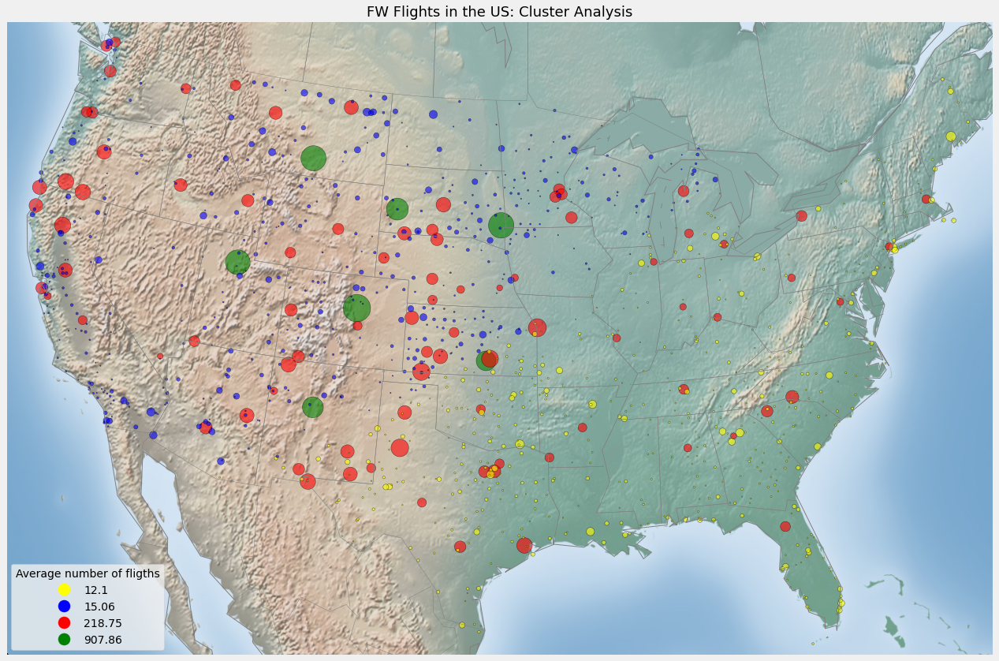

In [284]:
# Extract the data we're interested in
lat = flights.loc[flights.state != 'AK','Latitude'].values
lon = flights.loc[flights.state != 'AK','Longitude'].values
cluster = flights.loc[flights.state != 'AK','cluster'].values
count = flights.loc[flights.state != 'AK','total_flights'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting number of cluster 
# and size reflecting number of fligths
colours = ListedColormap(['yellow', 'blue','red', 'green'])
m.scatter(lon, lat, latlon=True, c=cluster, s=count, alpha=0.6, cmap=colours, edgecolor='black')

# 3. Create legend with cluster labels 
scatter = plt.scatter(lon, lat, c=cluster, cmap=colours)
labels = [round(flights[(flights.state != 'AK') & (flights.cluster == 1)].total_flights.mean(),2),
          round(flights[(flights.state != 'AK') & (flights.cluster == 2)].total_flights.mean(),2),
          round(flights[(flights.state != 'AK') & (flights.cluster == 3)].total_flights.mean(),2),
          round(flights[(flights.state != 'AK') & (flights.cluster == 4)].total_flights.mean(),2)]

legend = plt.legend(handles=scatter.legend_elements()[0], labels=labels, title='Average number of fligths')
for legend_handle in legend.legendHandles:
    legend_handle._legmarker.set_markersize(15)
    
plt.title('FW Flights in the US: Cluster Analysis', fontsize=18)
plt.show()

In [283]:
# The average number of fligths and services for each cluster
flights[flights.state != 'AK'].groupby('cluster')[['total_flights', 'Owner']].mean().round()

,total_flights,Owner
cluster,,
1.0,12.0,2.0
2.0,15.0,2.0
3.0,219.0,8.0
4.0,908.0,15.0


The outcomes of the cluster analysis are very interesting. We have 4 clusters. For the 4th cluster were assigned locations with the highest number of flights and services. The average number of flights for this cluster is around 907.86 flights, which is 4 times more than in the 3rd cluster. But then the average number of flights sharply decreases in the rest clusters. There are 12 and 15 average flights for the 1st and 2nd cluster respectively. Thus, It may imply the threshold between rural and urban areas. Another interesting observation that the 1st cluster took all cities in the east part and the 2nd cluster took all locations in the west part. It is happening probably because we included coordinates in KMeans algorithms and based on this information data is divided by these regions. Let's first look at the cities of the 4th cluster.

In [301]:
flights[flights.cluster == 4].iloc[:,:6]

,location,city,state,origin,destination,total_flights
0,Centennial (KAPA),Denver,CO,603,606,1209
1,Joe Foss Fld (KFSD),Sioux Falls,SD,521,521,1042
2,Billings Logan Intl (KBIL),Billings,MT,512,511,1023
3,Salt Lake City Intl (KSLC),Salt Lake City,UT,490,492,982
5,Rapid City Rgnl (KRAP),Rapid City,SD,382,391,773
6,Albuquerque Intl Sunport (KABQ),Albuquerque,NM,350,352,702
7,Wichita Eisenhower (KICT),Wichita,KS,312,312,624


So, we have 7 major cities. The reasons for the enormous number of flights might be the same as in Texas state. We can check it by plotting the same graph for population and density population which we did before for Texas.

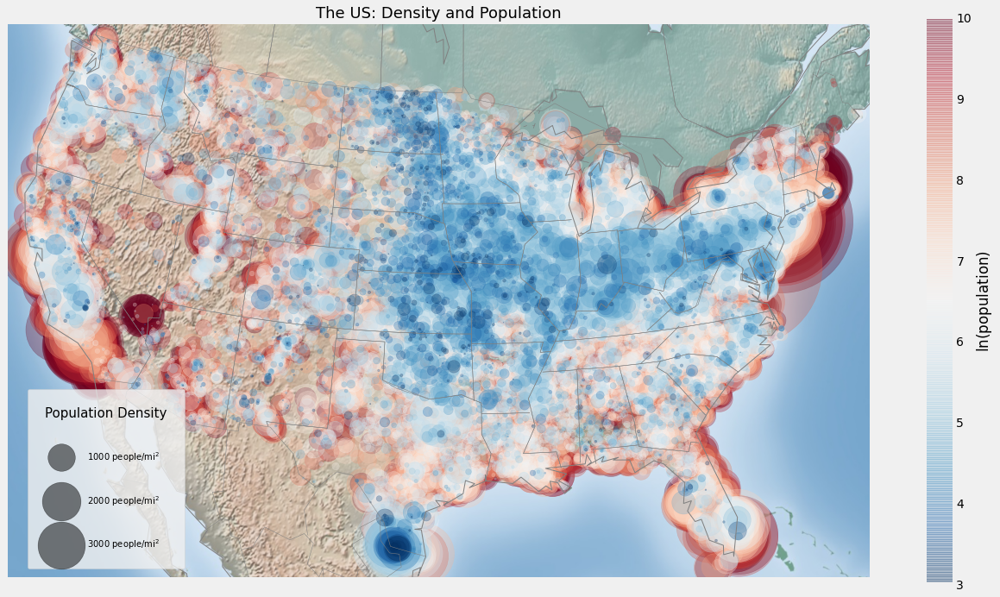

In [389]:
# Extract the data we're interested in
lat = pop['lat'].values
lon = pop['lng'].values
population = pop['population'].values
density = pop['density'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
m.scatter(lon, lat, latlon=True,
          c=np.log(population), s=density,
          cmap='RdBu_r', alpha=0.3)

# 3. create colorbar and legend
plt.colorbar(label=r'$\ln({\rm population})$', shrink=0.75)
plt.clim(3, 10)

# 4. make legend with dummy points
for density in [1000, 2000, 3000]:
    plt.scatter([], [], c='k', alpha=0.5, s=density,
                label=str(density) +' people/mi$^2$')
plt.legend(scatterpoints=1, frameon=True, labelspacing=3.5, title='Population Density', title_fontsize=15,
           loc='lower left', bbox_to_anchor=(0.02, 0.01, 0.5, 0.5), fontsize=10, borderpad=2, handletextpad=2)
plt.title('The US: Density and Population', fontsize=18)
plt.show()

As you can see on the map above, the regions were located the major cities have either few settlements or underpopulated and have a density population. According to the Texas analysis, the cities of the 3rd cluster corresponds with metropolisis in Texas. As a result, we can state that the cities in the 3rd cluster are urban areas and major cities in each state. So, we'll perform the same KNN classification to figure out what metropolis each rural city is closer. 

In [316]:
X_train = flights.loc[(flights.cluster == 4) | (flights.cluster == 3), ['Latitude', 'Longitude']]
y_train = [i for i in range(len(X))]
X_test = flights.loc[(flights.cluster == 1) | (flights.cluster == 2), ['Latitude', 'Longitude']]

In [318]:
# instantiate KNN algorithms
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)
y_test = knn.predict(X_test)

In [402]:
# concat test and train sets 
train = pd.concat([X_train.reset_index(drop=True), pd.Series(y_train)], axis=1)
test = pd.concat([X_test.reset_index(drop=True), pd.Series(y_test)], axis=1)
knn_res = pd.concat([test,train])

# merge knn labels
flights = flights.merge(knn_res).rename({0:'knn_label'}, axis=1)
flights.head()

,location,city,state,origin,destination,total_flights,Latitude,Longitude,Owner,cluster,knn_label
0,Centennial (KAPA),Denver,CO,603,606,1209,39.570099,-104.848999,26,4.0,0
1,Joe Foss Fld (KFSD),Sioux Falls,SD,521,521,1042,43.582001,-96.741898,11,4.0,1
2,Billings Logan Intl (KBIL),Billings,MT,512,511,1023,45.807701,-108.542999,16,4.0,2
3,Salt Lake City Intl (KSLC),Salt Lake City,UT,490,492,982,40.788399,-111.977997,18,4.0,3
4,Rapid City Rgnl (KRAP),Rapid City,SD,382,391,773,44.045300,-103.056999,9,4.0,4


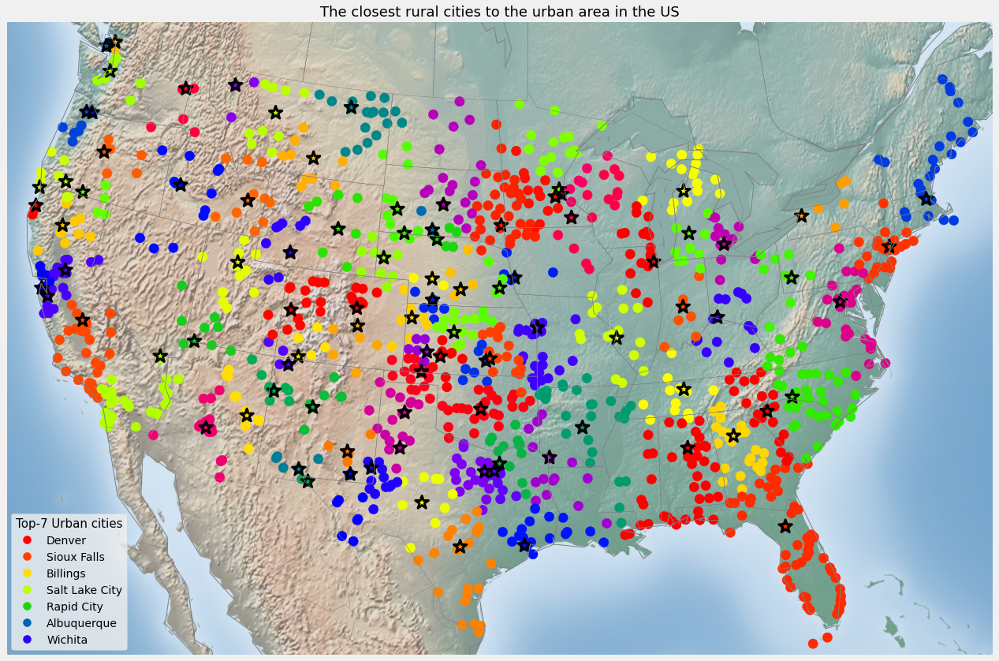

In [330]:
# Extract the data we're interested in
lat = knn_res['Latitude'].values
lon = knn_res['Longitude'].values
city = knn_res[0].values

x =  train['Longitude'].values
y = train['Latitude'].values
megalopolis = train[0].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting population
# and size reflecting area
m.scatter(lon, lat, latlon=True, c=city, cmap='prism', s=150)
m.scatter(x,y, latlon=True, marker='*', s=300, c=megalopolis, cmap='prism', linewidth=3, edgecolor='black')

# 3. Create legend with Megalosis labels 
scatter = plt.scatter(lon, lat, c=city, cmap='prism')
labels = list(flights[flights.cluster == 4].city)
legend = plt.legend(handles=scatter.legend_elements()[0], labels=labels, title='Top-7 Urban cities', title_fontsize=15)
for legend_handle in legend.legendHandles:
    legend_handle._legmarker.set_markersize(10)
    
plt.title('The closest rural cities to the urban area in the US', fontsize=18)
plt.show()

The map looks very cluttered and overwhelmed. So, it's better to use another tool for visualization. Thus, we created the same plot in Tableau.

In [405]:
# add type of area for each city
flights['area'] = np.where((flights.cluster == 4) | (flights.cluster == 3), 'urban', 'rural')

In [406]:
# flights.to_csv('..//Datasets/NEW/FW_cluster_analysis.csv', index=False)

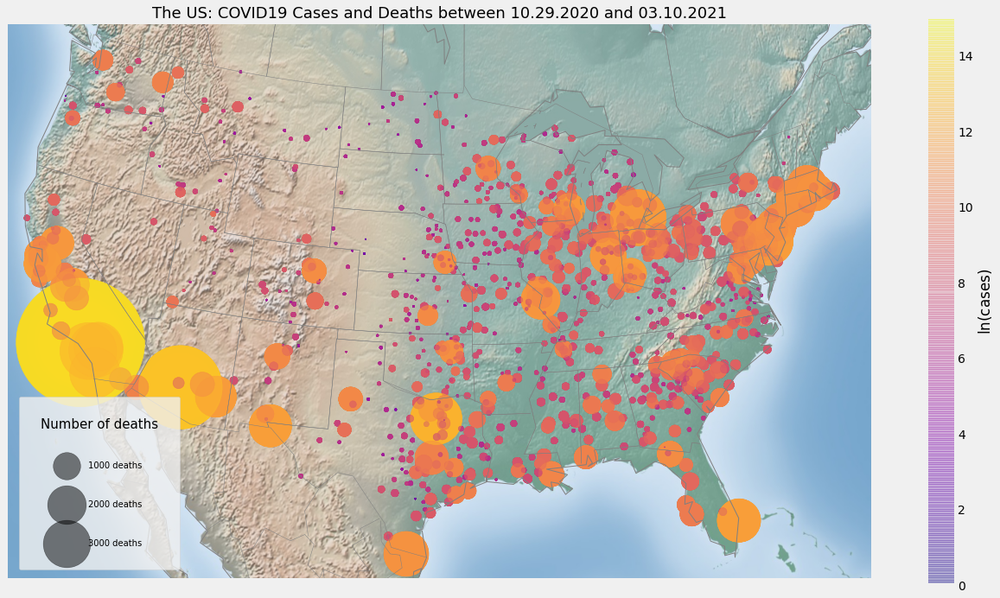

In [397]:
# Extract the data we're interested in
lat = covid['lat'].values
lon = covid['lng'].values
cases = covid['cases'].values
deaths = covid['deaths'].values

# 1. Draw the map background
fig = plt.figure(figsize=(20, 15))
m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawstates(color='gray')

# 2. scatter city data, with color reflecting cases
# and size reflecting deaths
m.scatter(lon, lat, latlon=True,c=np.log(cases), 
          s=deaths, cmap='plasma', alpha=0.3)

# 3. create colorbar and legend
plt.colorbar(label=r'$\ln({\rm cases})$', shrink=0.75)
plt.clim(0, 15)

# 4. make legend with dummy points
for deaths in [1000, 2000, 3000]:
    plt.scatter([], [], c='k', alpha=0.5, s=deaths,
                label=str(deaths) +' deaths')
plt.legend(scatterpoints=1, frameon=True, labelspacing=3.5, title='Number of deaths', title_fontsize=15,
           loc='lower left', bbox_to_anchor=(0.01, 0.01, 0.5, 0.5), fontsize=10, borderpad=2.5, handletextpad=1.5)
plt.title('The US: COVID19 Cases and Deaths between 10.29.2020 and 03.10.2021', fontsize=18)
plt.show()